In [1]:
import pathlib
import sklearn
import tensorflow as tf
import numpy as np
import seaborn as sns
import pandas as pd
import plotly.subplots
import plotly.express as px
import plotly.offline as py
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.figure_factory as ff
import os
import PIL
import ast
import shap
from xgboost import XGBClassifier
from tqdm import tqdm
import matplotlib.pyplot as plt
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout, Activation
from sklearn.model_selection import train_test_split
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import (accuracy_score, 
                            classification_report,
                            roc_auc_score, roc_curve, auc, precision_recall_curve,
                            confusion_matrix)
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, KFold

In [2]:
df = pd.read_csv("Dataset.csv")

In [3]:
df.shape

(91713, 186)

In [4]:
df.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.95,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.64,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma


In [5]:
df["hospital_death"]

0        0
1        0
2        0
3        0
4        0
        ..
91708    0
91709    0
91710    0
91711    0
91712    0
Name: hospital_death, Length: 91713, dtype: int64

In [6]:
df.info(verbose=True,null_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Data columns (total 186 columns):
 #    Column                         Non-Null Count  Dtype  
---   ------                         --------------  -----  
 0    encounter_id                   91713 non-null  int64  
 1    patient_id                     91713 non-null  int64  
 2    hospital_id                    91713 non-null  int64  
 3    hospital_death                 91713 non-null  int64  
 4    age                            87485 non-null  float64
 5    bmi                            88284 non-null  float64
 6    elective_surgery               91713 non-null  int64  
 7    ethnicity                      90318 non-null  object 
 8    gender                         91688 non-null  object 
 9    height                         90379 non-null  float64
 10   hospital_admit_source          70304 non-null  object 
 11   icu_admit_source               91601 non-null  object 
 12   icu_id                        

null_counts is deprecated. Use show_counts instead


In [7]:
df.isnull().any(axis=1).sum()

91688

In [8]:
large_missing = df.isnull().sum(axis=0).sort_values(ascending=False)[df.isnull().sum(axis=0).sort_values(ascending=False) > 25000]

print("\nTotal features with more than", 25000, "missing values:", len(large_missing))

df.drop(large_missing.index.tolist() + ['encounter_id', 'hospital_admit_source', 'icu_admit_source', 'icu_id', 'icu_stay_type', 'patient_id', 'hospital_id', 'readmission_status'], 
              axis=1,
             inplace = True)
df


Total features with more than 25000 missing values: 74


,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.730000,0,Caucasian,M,180.3,CTICU,0.541667,73.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,0,77.0,27.420000,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,0,25.0,31.950000,0,Caucasian,F,172.7,Med-Surg ICU,0.000694,95.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,0,81.0,22.640000,1,Caucasian,F,165.1,CTICU,0.000694,61.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,0,19.0,NaN,0,Caucasian,M,188.0,Med-Surg ICU,0.073611,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,0,75.0,23.060250,0,Caucasian,M,177.8,Cardiac ICU,0.298611,72.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,0,56.0,47.179671,0,Caucasian,F,183.0,Med-Surg ICU,0.120139,158.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,0,48.0,27.236914,0,Caucasian,M,170.2,Med-Surg ICU,0.046528,78.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,0,NaN,23.297481,0,Caucasian,F,154.9,Med-Surg ICU,0.081944,55.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [9]:
df.shape

(91713, 104)

In [10]:
df.nunique()

hospital_death                     2
age                               74
bmi                            34888
elective_surgery                   2
ethnicity                          6
                               ...  
leukemia                           2
lymphoma                           2
solid_tumor_with_metastasis        2
apache_3j_bodysystem              11
apache_2_bodysystem               10
Length: 104, dtype: int64

In [11]:
df = df[df[['bmi','weight','height']].isnull().sum(axis=1)==0]
df

,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.730000,0,Caucasian,M,180.3,CTICU,0.541667,73.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,0,77.0,27.420000,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,0,25.0,31.950000,0,Caucasian,F,172.7,Med-Surg ICU,0.000694,95.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,0,81.0,22.640000,1,Caucasian,F,165.1,CTICU,0.000694,61.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
5,0,67.0,27.560000,0,Caucasian,M,190.5,Med-Surg ICU,0.000694,100.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Neurological,Neurologic
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,0,75.0,23.060250,0,Caucasian,M,177.8,Cardiac ICU,0.298611,72.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,0,56.0,47.179671,0,Caucasian,F,183.0,Med-Surg ICU,0.120139,158.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,0,48.0,27.236914,0,Caucasian,M,170.2,Med-Surg ICU,0.046528,78.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,0,NaN,23.297481,0,Caucasian,F,154.9,Med-Surg ICU,0.081944,55.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [12]:
fig = px.histogram(df[['age','gender','hospital_death','bmi']].dropna(), x="age", y="hospital_death", color="gender",
                   marginal="box", # or violin, rug
                   hover_data=df[['age','gender','hospital_death','bmi']].columns)
fig.show()

In [13]:
age_death_F = df[df['gender'] == 'F'][['age','hospital_death']].groupby('age').mean().reset_index()
age_death_M = df[df['gender'] == 'M'][['age','hospital_death']].groupby('age').mean().reset_index()
from plotly.subplots import make_subplots
fig = make_subplots()
fig.add_trace(go.Scatter(x=age_death_F['age'],y=age_death_F['hospital_death'],name='Female patients'))
fig.add_trace(go.Scatter(x=age_death_M['age'],y=age_death_M['hospital_death'],name='Male patients'))
fig.update_layout(title_text = "<b>Average hospital death probability of patients</b>")
fig.update_xaxes(title_text = "<b>patient age</b>")
fig.update_yaxes(title_text = "<b>Average hospital deaths</b>",secondary_y=False)
fig.show()

In [14]:
weight_df = df[['weight','bmi','hospital_death']]
weight_df['weight'] = weight_df['weight'].round(0)
weight_df['bmi'] = weight_df['bmi'].round(0)
weight_death = weight_df[['weight','hospital_death']].groupby('weight').mean().reset_index()
bmi_death = weight_df[['bmi','hospital_death']].groupby('bmi').mean().reset_index()
fig = make_subplots(rows=1, cols=2, shared_yaxes=True)
fig.add_trace(go.Scatter(x=weight_death['weight'],y=weight_death['hospital_death'],name='weight'),row=1,col=1)
fig.add_trace(go.Scatter(x=bmi_death['bmi'],y=bmi_death['hospital_death'],name='bmi'),row=1,col=2)
fig.update_layout(title_text = "<b>impact of bmi and weight over a patients</b>")
fig.update_yaxes(title_text = "<b>Average Hospital deaths</b>")
fig.show()

In [15]:
ICU_type = df[['icu_type','age','hospital_death']]
ICU_type['icu_type']=ICU_type['icu_type'].replace({'CTICU':'CCU-CTICU','Cardiac ICU':'CCT-CTICU','CTICU':'CCT-CTICU','CSICU':'SICU'})
ICU_df = ICU_type.groupby(['icu_type','age']).mean().reset_index()
ICU_df['count'] = ICU_type.groupby(['icu_type','age']).count().reset_index()['hospital_death']
fig = px.scatter(ICU_df,x='age',y='hospital_death',size='count',color = 'icu_type',hover_name='icu_type',log_x=False,size_max=60)
fig.update_layout( title_text = "<b>Survival rate at different types of icu</b>")
fig.update_xaxes( title_text = "<b>age</b>")
fig.update_yaxes(title_text = "<b>Average hospital death</b>")
fig.show()

In [16]:
apache3=df[['age','apache_3j_bodysystem','hospital_death']]
apache3=apache3.groupby(['apache_3j_bodysystem','age']).agg(['size','mean']).reset_index()

apache3['size']=apache3['hospital_death']['size']
apache3['mean']=apache3['hospital_death']['mean']

apache3.drop('hospital_death',axis=1,inplace=True)

systems =list(apache3['apache_3j_bodysystem'].unique())
data = []
list_updatemenus = []
for n, s in enumerate(systems):
    visible = [False]*len(systems)
    visible[n] = True
    temp_dict = dict(label = str(s),
                     method = 'update',
                    args = [{'visible':visible},
                             {'title': "<b>"+s+"</b>"}])
    list_updatemenus.append(temp_dict)
for s in systems:
    mask = (apache3['apache_3j_bodysystem'].values == s)
    trace = (dict(visible = False,     
        x = apache3.loc[mask, 'age'],
        y = apache3.loc[mask, 'mean'],
        mode = 'markers',
        marker = {'size':apache3.loc[mask, 'size']/apache3.loc[mask,'size'].sum()*1000,
                 'color':apache3.loc[mask, 'mean'],
                 'showscale': True})
                   )
    data.append(trace)

data[0]['visible'] = True    
    
layout = dict(updatemenus=list([dict(buttons= list_updatemenus)]),
              xaxis=dict(title = '<b>Age<b>', range=[min(apache3.loc[:, 'age'])-10, max(apache3.loc[:, 'age']) + 10]),
              yaxis=dict(title = '<b>Average Hospital Death<b>', range=[min(apache3.loc[:, 'mean'])-0.1, max(apache3.loc[:, 'mean'])+0.1]),
              title='<b>Survival Rate<b>' )
fig = dict(data=data, layout=layout)
py.iplot(fig, filename='update_dropdown')

dropping on a non-lexsorted multi-index without a level parameter may impact performance.


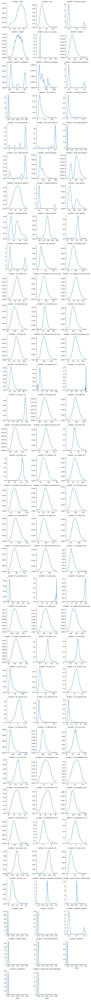

In [17]:
unpivot = pd.melt(df, df.describe().columns[0], df.describe().columns[1:])

g = sns.FacetGrid(unpivot, col="variable", col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, "value")

plt.show()

In [18]:
numerical_cat = [
 'elective_surgery',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

categorical = ['ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem']

In [19]:
df.nunique()[df.nunique() == 2].index.tolist()

['hospital_death',
 'elective_surgery',
 'gender',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

In [20]:
df.select_dtypes(include='O').columns.values.tolist()

['ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem']

In [21]:
not_numeric = df[numerical_cat+categorical+['hospital_death']].columns.tolist()
numeric_only = df.drop(not_numeric,axis=1).columns.tolist()
numeric_only

['age',
 'bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'apache_2_diagnosis',
 'apache_3j_diagnosis',
 'bun_apache',
 'creatinine_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'glucose_apache',
 'heart_rate_apache',
 'hematocrit_apache',
 'map_apache',
 'resprate_apache',
 'sodium_apache',
 'temp_apache',
 'wbc_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_temp_max',
 'd1_temp_min',
 'h1_diasbp_max',
 'h1_diasbp_min',
 'h1_diasbp_noninvasive_max',
 'h1_diasbp_noninvasive_min',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'h1_mbp_noninvasive_max',
 'h1_mbp_noninvasive_min',
 'h1_re

In [22]:
for col in numerical_cat:
    df[col] = df[col].astype('Int64')
for col in numerical_cat:
    df[col] = df[col].fillna(df[col].mode()[0])

In [23]:
df[numeric_only].isna().sum(axis=0).sort_values(ascending=False)

wbc_apache           21063
h1_temp_max          20833
h1_temp_min          20833
hematocrit_apache    19005
bun_apache           18289
                     ...  
d1_heartrate_min       108
bmi                      0
weight                   0
pre_icu_los_days         0
height                   0
Length: 84, dtype: int64

In [24]:
split_one = df[numeric_only].isna().sum(axis=0).sort_values()[df[numeric_only].isna().sum(axis=0) < 11000].index.tolist()
split_two = df[numeric_only].isna().sum(axis=0).sort_values()[df[numeric_only].isna().sum(axis=0) > 11000].index.tolist()

In [25]:
split_one

['bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'd1_heartrate_min',
 'd1_heartrate_max',
 'd1_sysbp_min',
 'd1_sysbp_max',
 'd1_diasbp_min',
 'd1_diasbp_max',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_spo2_min',
 'd1_spo2_max',
 'd1_resprate_max',
 'd1_resprate_min',
 'heart_rate_apache',
 'map_apache',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_diasbp_noninvasive_min',
 'd1_diasbp_noninvasive_max',
 'apache_3j_diagnosis',
 'resprate_apache',
 'd1_mbp_noninvasive_min',
 'd1_mbp_noninvasive_max',
 'apache_2_diagnosis',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'gcs_eyes_apache',
 'd1_temp_min',
 'd1_temp_max',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_sysbp_min',
 'h1_sysbp_max',
 'h1_diasbp_min',
 'h1_diasbp_max',
 'temp_apache',
 'h1_spo2_max',
 'h1_spo2_min',
 'age',
 'h1_resprate_max',
 'h1_resprate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'd1_glucose_min',
 'd1_glucose_max',
 'h1_sysbp_noninvasive_min',
 'h1_sysbp_noninvasive_max',
 'h1_diasbp_noninvasive_max',


In [26]:
split_two

['d1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_hemaglobin_min',
 'd1_hemaglobin_max',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'd1_platelets_min',
 'd1_platelets_max',
 'd1_hco3_max',
 'd1_hco3_min',
 'sodium_apache',
 'creatinine_apache',
 'bun_apache',
 'hematocrit_apache',
 'h1_temp_min',
 'h1_temp_max',
 'wbc_apache']

In [27]:
for col in split_two:
    df[col] = df[col].fillna(df[col].mean())
process_data = df.dropna(axis=0)

In [28]:
process_data[categorical].nunique()

ethnicity                6
gender                   2
icu_type                 8
apache_3j_bodysystem    11
apache_2_bodysystem     10
dtype: int64

In [29]:
icu_data = pd.get_dummies(process_data,prefix='isin',prefix_sep='_',columns=categorical,drop_first=False)


In [30]:
icu_data.reset_index(drop=True,inplace=True)
icu_data

,hospital_death,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,...,isin_Cardiovascular,isin_Gastrointestinal,isin_Haematologic,isin_Metabolic,isin_Neurologic,isin_Renal/Genitourinary,isin_Respiratory,isin_Trauma,isin_Undefined Diagnoses,isin_Undefined diagnoses
0,0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,...,1,0,0,0,0,0,0,0,0,0
1,0,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,...,0,0,0,0,0,0,1,0,0,0
2,0,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0,...,0,0,0,0,1,0,0,0,0,0
3,0,46.0,25.845717,0,167.6,0.000000,72.6,108.0,203.01,0,...,0,0,0,0,0,0,1,0,0,0
4,0,87.0,21.963763,0,180.3,5.046528,71.4,113.0,501.05,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53108,0,47.0,51.439842,1,195.0,0.033333,186.0,304.0,1406.01,1,...,0,1,0,0,0,0,0,0,0,0
53109,0,54.0,19.770448,0,177.8,0.025694,62.5,109.0,108.01,0,...,1,0,0,0,0,0,0,0,0,0
53110,0,75.0,23.060250,0,177.8,0.298611,72.9,113.0,501.06,0,...,1,0,0,0,0,0,0,0,0,0
53111,0,56.0,47.179671,0,183.0,0.120139,158.0,113.0,501.05,0,...,1,0,0,0,0,0,0,0,0,0


In [31]:
icu_data.columns = [x.lower() for x in icu_data.columns.tolist()]
icu_data = icu_data.loc[:,~icu_data.columns.duplicated()]

In [32]:
icu_data

,hospital_death,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,...,isin_metabolic,isin_musculoskeletal/skin,isin_neurological,isin_respiratory,isin_sepsis,isin_trauma,isin_haematologic,isin_neurologic,isin_renal/genitourinary,isin_undefined diagnoses
0,0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,...,0,0,0,0,1,0,0,0,0,0
1,0,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,...,0,0,0,1,0,0,0,0,0,0
2,0,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0,...,0,0,1,0,0,0,0,1,0,0
3,0,46.0,25.845717,0,167.6,0.000000,72.6,108.0,203.01,0,...,0,0,0,1,0,0,0,0,0,0
4,0,87.0,21.963763,0,180.3,5.046528,71.4,113.0,501.05,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53108,0,47.0,51.439842,1,195.0,0.033333,186.0,304.0,1406.01,1,...,0,0,0,0,0,0,0,0,0,0
53109,0,54.0,19.770448,0,177.8,0.025694,62.5,109.0,108.01,0,...,0,0,0,0,0,0,0,0,0,0
53110,0,75.0,23.060250,0,177.8,0.298611,72.9,113.0,501.06,0,...,0,0,0,0,1,0,0,0,0,0
53111,0,56.0,47.179671,0,183.0,0.120139,158.0,113.0,501.05,0,...,0,0,0,0,1,0,0,0,0,0


In [33]:
t = icu_data['arf_apache'].dtype
for col in tqdm(icu_data.columns.tolist()):
    if icu_data[col].values.dtype == 'uint8' or t == icu_data[col].values.dtype:
        icu_data[col] = icu_data[col].astype(int)

100%|██████████| 130/130 [00:00<00:00, 3227.34it/s]


In [34]:
icu_data.dtypes

hospital_death                int64
age                         float64
bmi                         float64
elective_surgery              int64
height                      float64
                             ...   
isin_trauma                   int64
isin_haematologic             int64
isin_neurologic               int64
isin_renal/genitourinary      int64
isin_undefined diagnoses      int64
Length: 130, dtype: object

In [35]:
x = icu_data.drop(['hospital_death'],axis=1)
y = icu_data['hospital_death']
X_new = x[['apache_4a_hospital_death_prob','apache_4a_icu_death_prob','age','d1_spo2_min','d1_resprate_max','d1_heartrate_min']]

x_train,x_test,y_train,y_test = train_test_split(X_new,y,test_size=0.30,random_state=11,stratify = y)

In [69]:
x_train.shape

(37179, 6)

In [70]:
y_train.shape

(37179,)

In [92]:
import keras
from keras.models import Sequential
from keras.layers import Dense
model = Sequential()
model.add(Dense(6, input_dim=6, activation='relu'))
model.add(Dense(3, activation='relu'))
model.add(Dense(1,activation='sigmoid'))

In [93]:
import tensorflow as tf
opt = tf.keras.optimizers.SGD(learning_rate=0.00001)
model.compile(loss='binary_crossentropy', optimizer=opt, metrics=['accuracy'])
model.fit(x_train, y_train,validation_data=(x_test,y_test), epochs=20, batch_size=64)

Epoch 1/20
581/581 [==============================] - 2s 2ms/step - loss: 2.3013 - accuracy: 0.9124 - val_loss: 2.0994 - val_accuracy: 0.9122
Epoch 2/20
581/581 [==============================] - 1s 2ms/step - loss: 1.8679 - accuracy: 0.9124 - val_loss: 1.7144 - val_accuracy: 0.9120
Epoch 3/20
581/581 [==============================] - 1s 2ms/step - loss: 1.5288 - accuracy: 0.9124 - val_loss: 1.4158 - val_accuracy: 0.9119
Epoch 4/20
581/581 [==============================] - 1s 2ms/step - loss: 1.2673 - accuracy: 0.9125 - val_loss: 1.1830 - val_accuracy: 0.9119
Epoch 5/20
581/581 [==============================] - 1s 2ms/step - loss: 1.0640 - accuracy: 0.9125 - val_loss: 1.0013 - val_accuracy: 0.9120
Epoch 6/20
581/581 [==============================] - 1s 2ms/step - loss: 0.9063 - accuracy: 0.9125 - val_loss: 0.8590 - val_accuracy: 0.9119
Epoch 7/20
581/581 [==============================] - 1s 2ms/step - loss: 0.7824 - accuracy: 0.9125 - val_loss: 0.7469 - val_accuracy: 0.9119
Epoch 

In [94]:
keras.models.save_model(model,'model')

INFO:tensorflow:Assets written to: model/assets


In [95]:
from tensorflow import keras

In [96]:
m = keras.models.load_model('model')
m.predict([[1,2,3,4,5,6]])

1/1 [==============================] - 0s 80ms/step


array([[0.49536875]], dtype=float32)

In [97]:
x = icu_data.drop(['hospital_death'],axis=1)
y = icu_data['hospital_death']
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.30,random_state=11,stratify = y)

In [98]:
y_train.value_counts()

0    33923
1     3256
Name: hospital_death, dtype: int64

In [99]:
y_test.value_counts()

0    14538
1     1396
Name: hospital_death, dtype: int64

In [100]:
def modelling(x_train,y_train,x_test,y_test,**kwargs):
    model = []
    scores = {}
    if 'xgb' in kwargs.keys() and kwargs['xgb']:
        xgb = XGBClassifier()
        xgb.fit(x_train._get_numeric_data(),np.ravel(y_train,order='C'))
        y_pred = xgb.predict(x_test._get_numeric_data())
        scores['xgb'] = [accuracy_score(y_test,y_pred),roc_auc_score(y_test,y_pred)]
        model.append(xgb)
    if 'rf' in kwargs.keys() and kwargs['rf']:
        rf = RandomForestClassifier()
        rf.fit(x_train,y_train)
        y_pred = rf.predict(x_test)
        scores['rf'] = [accuracy_score(y_test,y_pred),roc_auc_score(y_test,y_pred)]
        model.append(rf)
    if 'extree' in kwargs.keys() and kwargs['extree']:
        extree = ExtraTreesClassifier()
        extree.fit(x_train,y_train)
        y_pred = extree.predict(x_test)
        scores['extree'] = [accuracy_score(y_test,y_pred),roc_auc_score(y_test,y_pred)]
        model.append(extree)
    return scores

In [101]:
modelling(x_train,y_train,x_test,y_test,xgb = True,rf=True,extree = True)

{'xgb': [0.9247521024224927, 0.6495594886003719],
 'rf': [0.9262583155516506, 0.6173600082148117],
 'extree': [0.9231831304129534, 0.5888015638100487]}

In [102]:
def model_performance(model, y_test, y_hat) : 
    conf_matrix = confusion_matrix(y_test, y_hat)
    trace1 = go.Heatmap(z = conf_matrix  ,x = ["0 (pred)","1 (pred)"],
                        y = ["0 (true)","1 (true)"],xgap = 2, ygap = 2, 
                        colorscale = 'Viridis', showscale  = False)
    tp = conf_matrix[1,1]
    fn = conf_matrix[1,0]
    fp = conf_matrix[0,1]
    tn = conf_matrix[0,0]
    Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
    Precision =  (tp/(tp+fp))
    Recall    =  (tp/(tp+fn))
    F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

    show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
    show_metrics = show_metrics.T

    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue']
    trace2 = go.Bar(x = (show_metrics[0].values), 
                   y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto',
                   orientation = 'h', opacity = 0.8,marker=dict(
            color=colors,
            line=dict(color='#000000',width=1.5)))
    model_roc_auc = round(roc_auc_score(y_test, y_hat) , 3)
    fpr, tpr, t = roc_curve(y_test, y_hat)
    trace3 = go.Scatter(x = fpr,y = tpr,
                        name = "Roc : " + str(model_roc_auc),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2), fill='tozeroy')
    trace4 = go.Scatter(x = [0,1],y = [0,1],
                        line = dict(color = ('black'),width = 1.5,
                        dash = 'dot'))
    precision, recall, thresholds = precision_recall_curve(y_test, y_hat)
    trace5 = go.Scatter(x = recall, y = precision,
                        name = "Precision" + str(precision),
                        line = dict(color = ('lightcoral'),width = 2), fill='tozeroy')
    model = model

    fig = tls.make_subplots(rows=2, cols=2, print_grid=False, 
                          specs=[ 
                                 [{}, {}],
                                 [{}, {}],
                                ],
                          subplot_titles=('Confusion Matrix',
                                        'Metrics',
                                        'ROC curve'+" "+ '('+ str(model_roc_auc)+')',
                                        'Precision - Recall curve',
                                        ))
    
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,2,1)
    fig.append_trace(trace4,2,1)
    fig.append_trace(trace5,2,2)
    
    fig['layout'].update(showlegend = False, title = '<b>Model performance report</b><br>'+str(model),
                        autosize = False, height = 1500,width = 830,
                        plot_bgcolor = 'rgba(240,240,240, 0.95)',
                        paper_bgcolor = 'rgba(240,240,240, 0.95)',
                        margin = dict(b = 195))
    fig.layout.titlefont.size = 14
    
    py.iplot(fig)

In [103]:
gkf = KFold(n_splits=3,shuffle = True,random_state=42).split(x_train,y_train)
fit_params_of_xgb = {
    "early_stopping_rounds":100, 
    "eval_metric" : 'auc', 
    "eval_set" : [(x_test, y_test)],
    'verbose': 100,
}
params = {
    'booster': ["gbtree"],
    'learning_rate': [0.1],
    'n_estimators': range(100, 500, 100),
    'min_child_weight': [1],
    'gamma': [0],
    'subsample': [0.8],
    'colsample_bytree': [0.8],
    'max_depth': [5],
    "scale_pos_weight": [1]
}
xgb_estimator = XGBClassifier(objective='binary:logistic')
gsearch = GridSearchCV(estimator= xgb_estimator,
                      param_grid= params,
                      scoring= 'roc_auc',
                      n_jobs=-1,
                      cv=gkf)
xgb_model = gsearch.fit(x_train,y_train,**fit_params_of_xgb)
(gsearch.best_params_,gsearch.best_score_)

`eval_metric` in `fit` method is deprecated for better compatibility with scikit-learn, use `eval_metric` in constructor or`set_params` instead.
`early_stopping_rounds` in `fit` method is deprecated for better compatibility with scikit-learn, use `early_stopping_rounds` in constructor or`set_params` instead.


[0]	validation_0-auc:0.85183
[99]	validation_0-auc:0.89370


({'booster': 'gbtree',
  'colsample_bytree': 0.8,
  'gamma': 0,
  'learning_rate': 0.1,
  'max_depth': 5,
  'min_child_weight': 1,
  'n_estimators': 100,
  'scale_pos_weight': 1,
  'subsample': 0.8},
 0.8828784372427355)

In [104]:
xgb_tuned = XGBClassifier(n_estimators = 3000,
                          objective= 'binary:logistic',
                          learning_rate = 0.01,
                          booster = 'gbtree',
                          min_child_weight = 6,
                          max_depth = 4,
                          scale_pos_weight = 1,
                          gamma = 0,
                          subsample = 0.4,
                          colsample_bytree = 0.8,
                          reg_alpha = 0.08,
                          n_jobs =-1
                         )
xgb_tuned.fit(x_train,np.ravel(y_train,order='C'))
y_hat = xgb_tuned.predict(x_test._get_numeric_data())

In [105]:
x_train

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,...,isin_metabolic,isin_musculoskeletal/skin,isin_neurological,isin_respiratory,isin_sepsis,isin_trauma,isin_haematologic,isin_neurologic,isin_renal/genitourinary,isin_undefined diagnoses
19823,55.0,32.593121,0,152.4,0.563194,75.7,303.0,211.09,0,0,...,0,0,0,1,0,0,0,0,0,0
21449,73.0,30.862284,1,190.5,1.683333,112.0,203.0,1206.03,1,0,...,0,0,0,0,0,0,0,0,0,0
26188,36.0,22.534902,1,167.6,0.084722,63.3,208.0,1601.01,1,0,...,0,0,0,0,0,1,0,0,0,0
50913,22.0,36.772000,0,144.8,0.006250,77.1,113.0,502.01,0,0,...,0,0,0,0,1,0,0,0,0,0
50807,52.0,18.921389,0,154.9,0.023611,45.4,301.0,403.01,0,0,...,0,0,1,0,0,0,0,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
926,75.0,26.079205,0,149.9,0.029167,58.6,124.0,306.01,0,0,...,0,0,0,0,0,0,0,0,0,0
43753,64.0,27.447725,1,167.6,0.357639,77.1,214.0,1404.01,1,0,...,0,0,0,0,0,0,0,0,0,0
46779,59.0,23.858025,0,180.0,0.031250,77.3,112.0,107.01,0,0,...,0,0,0,0,0,0,0,0,0,0
47775,72.0,22.332902,0,180.3,0.336806,72.6,301.0,410.01,0,0,...,0,0,1,0,0,0,0,1,0,0


In [106]:
y_hat[21:30]

array([1, 0, 1, 0, 0, 0, 0, 0, 0])

In [107]:
model_performance(xgb_tuned,y_test,y_hat)

plotly.tools.make_subplots is deprecated, please use plotly.subplots.make_subplots instead


In [108]:
x_test_sample = x_test.sample(2500)
x_test_sample

,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,arf_apache,...,isin_metabolic,isin_musculoskeletal/skin,isin_neurological,isin_respiratory,isin_sepsis,isin_trauma,isin_haematologic,isin_neurologic,isin_renal/genitourinary,isin_undefined diagnoses
43568,51.0,28.981895,0,177.8,0.024306,91.62,302.0,111.01,0,0,...,0,0,0,0,0,0,0,0,0,0
51527,67.0,35.437579,0,175.3,0.002778,108.90,109.0,108.01,0,0,...,0,0,0,0,0,0,0,0,0,0
35170,42.0,25.000000,0,160.0,0.032639,64.00,302.0,109.02,0,0,...,0,0,0,0,0,0,0,0,0,0
26041,79.0,18.026035,0,162.5,0.045833,47.60,301.0,405.01,0,0,...,0,0,1,0,0,0,0,1,0,0
40424,59.0,36.015625,1,160.0,0.279861,92.20,203.0,1206.03,1,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
15497,63.0,30.712426,1,162.5,2.656944,81.10,301.0,1506.06,1,0,...,0,0,1,0,0,0,0,1,0,0
44092,72.0,33.203125,0,160.0,0.053472,85.00,109.0,108.01,0,0,...,0,0,0,0,0,0,0,0,0,0
44658,52.0,26.822874,0,172.7,1.251389,80.00,304.0,311.01,0,0,...,0,0,0,0,0,0,0,0,0,0
6668,59.0,25.824950,0,177.8,0.050694,81.64,112.0,107.01,0,0,...,0,0,0,0,0,0,0,0,0,0


In [109]:
shap.initjs()
shap_values = shap.TreeExplainer(xgb_tuned).shap_values(x_test_sample)

ntree_limit is deprecated, use `iteration_range` or model slicing instead.


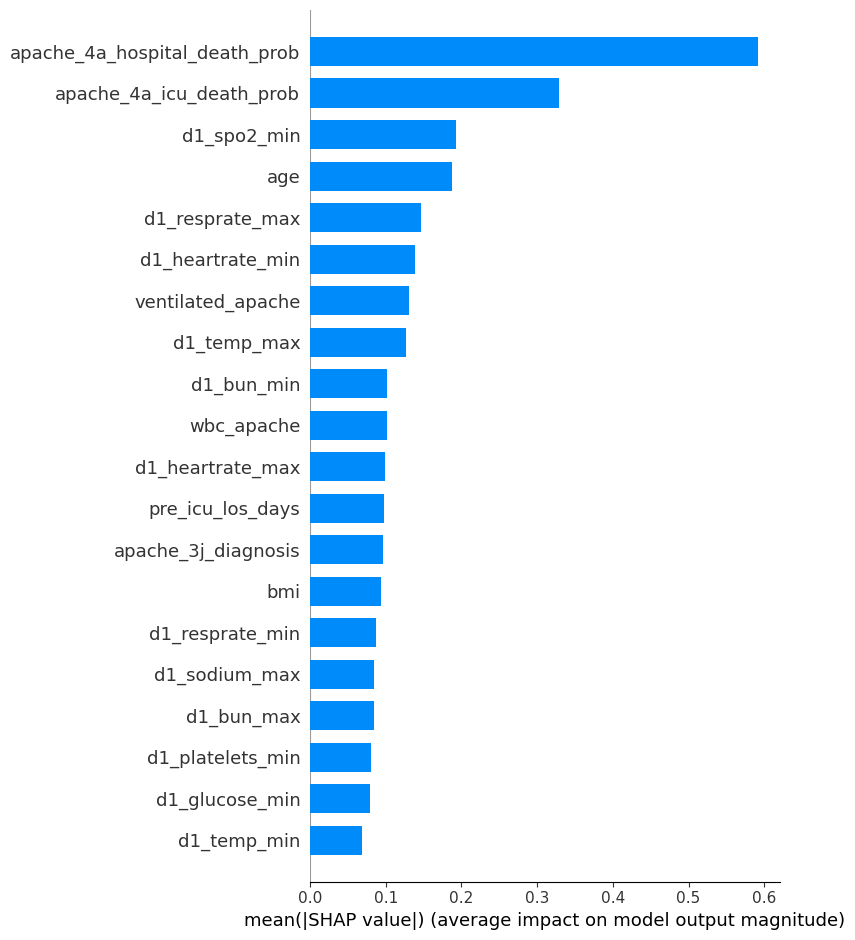

In [110]:
shap.summary_plot(shap_values,x_test_sample,plot_type='bar')

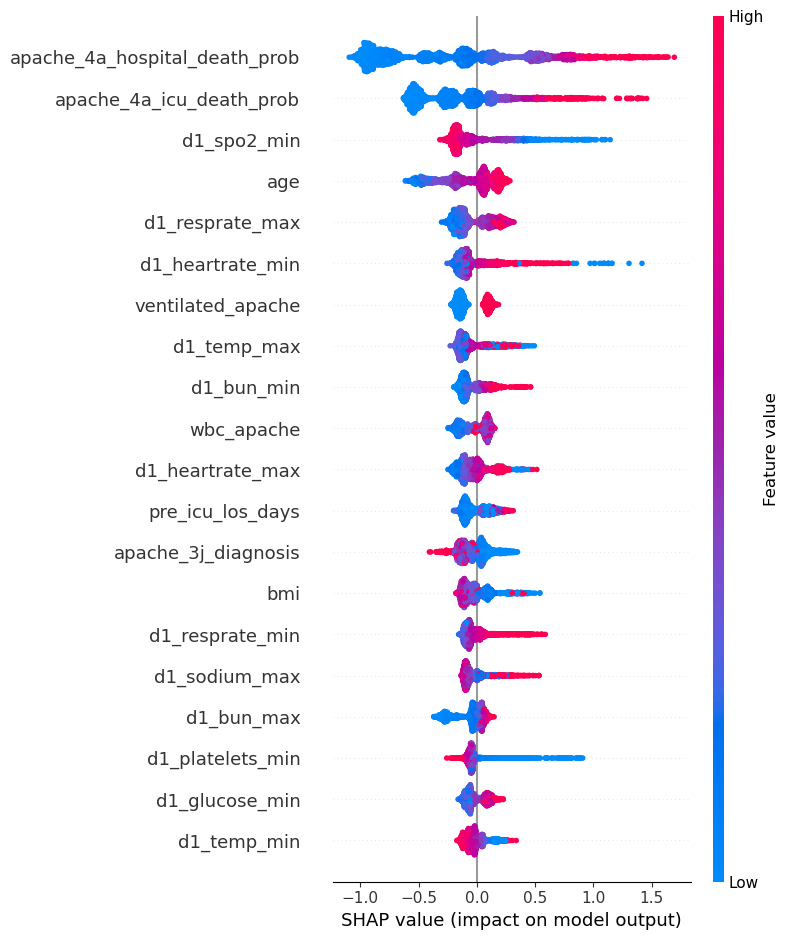

In [111]:
shap.summary_plot(shap_values,x_test_sample)

In [112]:
shap.force_plot(shap.TreeExplainer(xgb_tuned).expected_value,shap_values[0:257,:],x_test_sample.iloc[0:257,:])

In [113]:
print(y_hat[50])
shap.force_plot(shap.TreeExplainer(xgb_tuned).expected_value,shap_values[50],x_test_sample.iloc[50])

0


In [114]:
print(y_hat[21])
shap.force_plot(shap.TreeExplainer(xgb_tuned).expected_value,shap_values[21],x_test_sample.iloc[21])

1


In [115]:
print(y_hat[23])
shap.force_plot(shap.TreeExplainer(xgb_tuned).expected_value,shap_values[23],x_test_sample.iloc[23])

1


In [116]:
print(y_hat[60])
shap.force_plot(shap.TreeExplainer(xgb_tuned).expected_value,shap_values[60],x_test_sample.iloc[60])

0


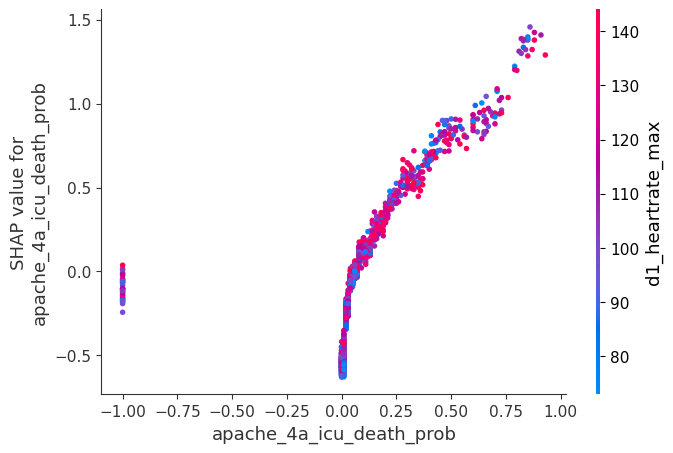

In [117]:
shap.dependence_plot('apache_4a_icu_death_prob', shap_values, x_test_sample)

100%|===================| 2491/2500 [02:28<00:00]        

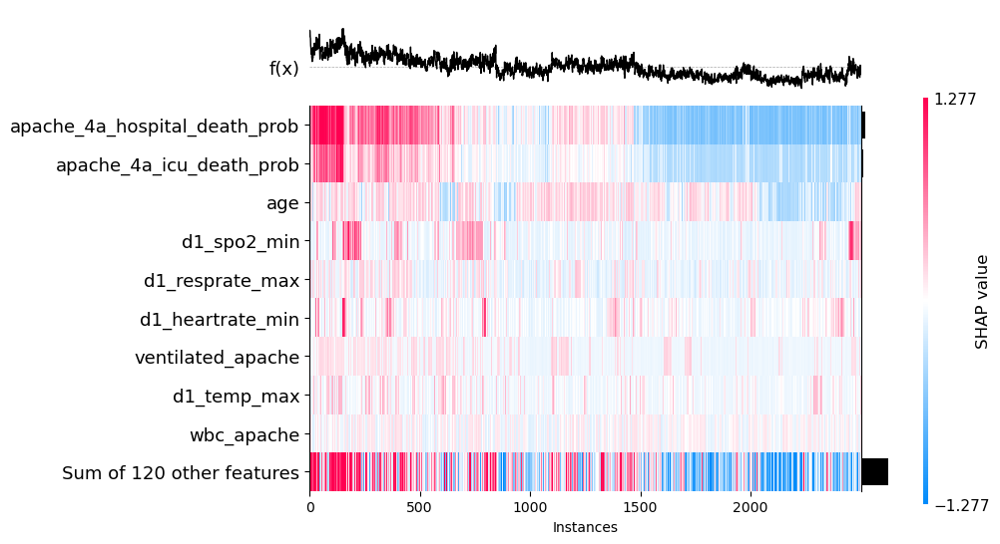

In [118]:
shap.plots.heatmap(shap.TreeExplainer(xgb_tuned,data=x_test_sample)(x_test_sample))

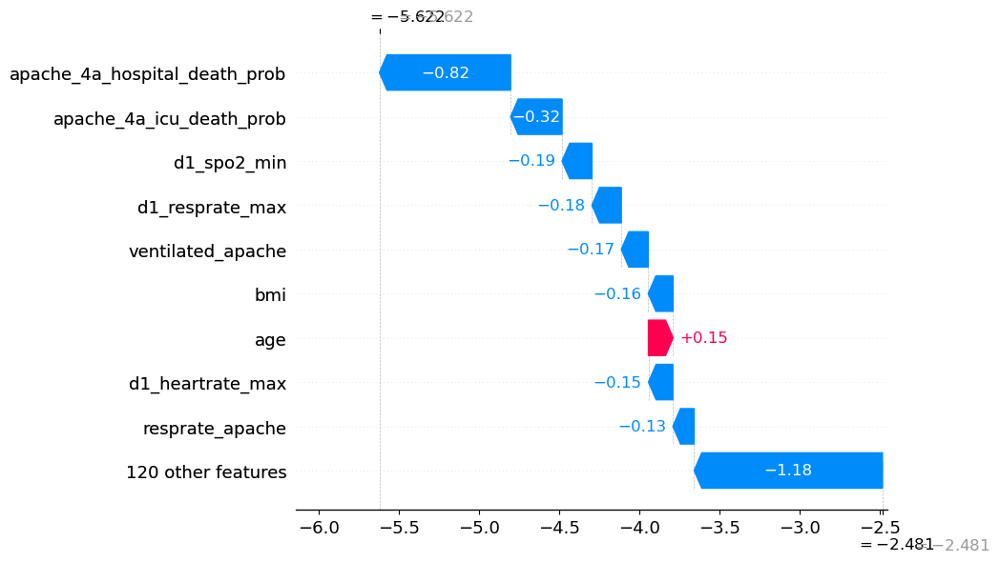

In [119]:
row = 111
shap.plots._waterfall.waterfall_legacy(shap.TreeExplainer(xgb_tuned).expected_value[0], 
                                       shap_values[row],
                                       feature_names=x_test_sample.columns.tolist()
                                      )

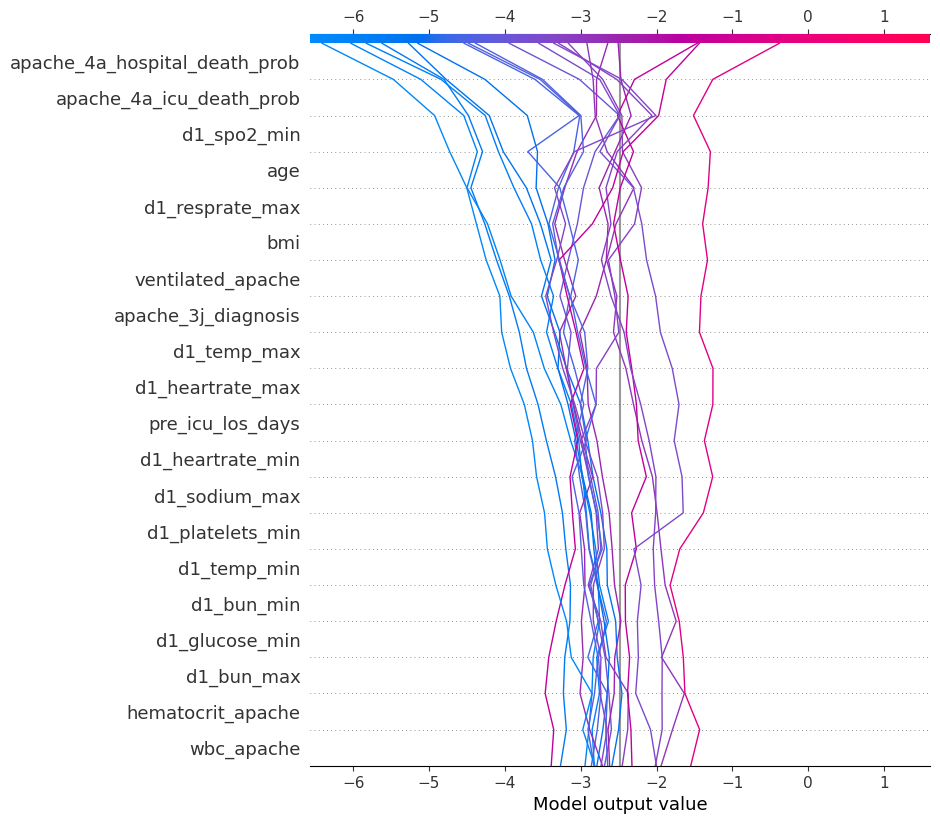

In [120]:
shap.decision_plot(shap.TreeExplainer(xgb_tuned).expected_value[0], 
                   shap_values[110:130], 
                   feature_names=x_test_sample.columns.tolist())

In [60]:
desc = pd.read_csv("Data Dictionary.csv")
feats_ = ['apache_4a_icu_death_prob', 'apache_4a_hospital_death_prob', 'age', 'd1_spo2_min',
'd1_resprate_max', 'd1_heartrate_min', 'd1_temp_max', 'ventilated_apache', 'd1_bun_min',
'apache_3j_diagnosis', 'bmi']

desc[desc["Variable Name"].isin(feats_)][['Variable Name', 'Description']]

,Variable Name,Description
4,age,The age of the patient on unit admission
5,bmi,The body mass index of the person on unit admi...
21,apache_3j_diagnosis,The APACHE III-J sub-diagnosis code which best...
45,ventilated_apache,Whether the patient was invasively ventilated ...
54,d1_heartrate_min,The patient's lowest heart rate during the fir...
61,d1_resprate_max,The patient's highest respiratory rate during ...
64,d1_spo2_min,The patient's lowest peripheral oxygen saturat...
71,d1_temp_max,The patient's highest core temperature during ...
104,d1_bun_min,The lowest blood urea nitrogen concentration o...
175,apache_4a_hospital_death_prob,The APACHE IVa probabilistic prediction of in-...


In [61]:
import joblib
with open('./xgb_tuned_final.pkl', 'wb') as m:
    joblib.dump(xgb_tuned, m, compress=3)

In [62]:
feats = x_test.columns.to_list()
dtypes = x_test.dtypes.values.tolist()
with open("./feats.pkl", 'wb') as f:
    joblib.dump(feats, f)

with open("./dtypes.pkl", 'wb') as d:
    joblib.dump(dtypes, d)

In [63]:
x_test.shape

(15934, 6)

In [64]:
import requests
import json
url = 'http://127.0.0.1:5000/api/predict'

In [65]:
json.dumps([1,2,3,4])

'[1, 2, 3, 4]'

In [66]:
i = x_test.iloc[0].values.tolist()
json.dumps(i)

'[0.02, 0.01, 31.0, 99.0, 26.0, 75.0]'

In [67]:
type(ast.literal_eval('[1, 2, 3, 4]'))

list